In [ ]:
import torch
import torch.nn.functional as F
from PIL import Image
import numpy as np
from tqdm.notebook import tqdm
import random
from difflib import SequenceMatcher
from transformers import CLIPModel, CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, DDIMScheduler

In [2]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
num_inference_steps = 50
dtype = torch.float32

In [3]:
model_path_clip = "openai/clip-vit-large-patch14"
clip_tokenizer = CLIPTokenizer.from_pretrained(model_path_clip, cache_dir="./cache")
clip_model = CLIPModel.from_pretrained(model_path_clip, torch_dtype=dtype, cache_dir="./cache")
clip = clip_model.text_model

model_path_diffusion = "CompVis/stable-diffusion-v1-4"
unet = UNet2DConditionModel.from_pretrained(model_path_diffusion, cache_dir="/mnt/mmlab2024nas/huy08112004/IP-Composer/DDIM/cache", subfolder="unet", torch_dtype=dtype)
vae = AutoencoderKL.from_pretrained(model_path_diffusion, cache_dir="/mnt/mmlab2024nas/huy08112004/IP-Composer/DDIM/cache", subfolder="vae", torch_dtype=dtype)

unet.to(device)
vae.to(device)
clip.to(device)

scheduler = DDIMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", clip_sample=False, set_alpha_to_one=False)


class Pipeline:
    def __init__(self, vae, unet, tokenizer, text_encoder, scheduler):
        self.vae = vae
        self.unet = unet
        self.tokenizer = tokenizer
        self.text_encoder = text_encoder
        self.scheduler = scheduler
pipe = Pipeline(vae, unet, clip_tokenizer, clip, scheduler)

In [4]:
### Prompt to prompt controller
class Controller:
    def __init__(self, text_inputs, prompt_edit_token_weights=[], tokenizer=None, device="cuda", dtype=torch.float16):
        assert len(text_inputs) == 2, "Currently only support one base prompt and one edited prompt."
        self.device = device
        self.dtype = dtype
        self.is_ptp = False
        self.is_att_cross_replace = False
        self.is_att_self_replace = False
        self.att_weight = self.building_att_weight(prompt_edit_token_weights, tokenizer)
        self.att_mask, self.indices_base = self.building_att_replace(text_inputs[0], text_inputs[1], tokenizer)


    def building_att_replace(self, text_input_base, text_input_edit, tokenizer):
        max_len = tokenizer.model_max_length
        masks = torch.zeros(max_len)
        indices_base = torch.zeros(max_len, dtype=torch.long)
        indices_edit = torch.arange(max_len, dtype=torch.long)

        for name, x0, x1, y0, y1 in SequenceMatcher(None, text_input_base, text_input_edit).get_opcodes():
            if y0 < max_len:
                if name == "equal" or (name == "replace" and x1 - x0 == y1 - y0):
                    masks[y0: y1] = 1
                    indices_base[x0: x1] = indices_edit[y0: y1]
        return masks.to(self.device, dtype=self.dtype), indices_base.to(self.device)
                
                
    def building_att_weight(self, weight_tuples, tokenizer):
        max_len = tokenizer.model_max_length
        weights = torch.ones(max_len)
        for i, w in weight_tuples:
            weights[i] = w
        return weights.to(self.device, dtype=self.dtype)


    def __call__(self, att_maps, heads, is_cross):
        if self.is_ptp == False: 
            return att_maps
        is_att_replace = self.is_att_cross_replace if is_cross else self.is_att_self_replace
        att_base = att_maps[0: heads]
        att_edit = att_maps[heads:]

        if is_att_replace:
            if is_cross:
                att_base_mapped = torch.index_select(att_base, -1, self.indices_base)
                att_edit = att_edit * (1 - self.att_mask) + att_base_mapped * self.att_mask
            else:
                att_edit = att_base.clone()

        if is_cross:
            att_edit = att_edit * self.att_weight

        return torch.cat([att_base, att_edit])


In [5]:
def register_attention_control(model, outer):
    def reshape_heads_to_batch_dim(self, tensor):
        batch_size, seq_len, dim = tensor.shape
        head_size = self.heads
        tensor = tensor.reshape(batch_size, seq_len, head_size, dim // head_size)
        tensor = tensor.permute(0, 2, 1, 3).reshape(batch_size * head_size, seq_len, dim // head_size)
        return tensor

    def reshape_batch_dim_to_heads(self, tensor):
        batch_size, seq_len, dim = tensor.shape
        head_size = self.heads
        tensor = tensor.reshape(batch_size // head_size, head_size, seq_len, dim)
        tensor = tensor.permute(0, 2, 1, 3).reshape(batch_size // head_size, seq_len, dim * head_size)
        return tensor
    
    def forward(self, x, encoder_hidden_states=None, attention_mask=None):
        context = encoder_hidden_states
        mask = attention_mask
        batch_size, sequence_length, dim = x.shape
        h = self.heads
        q = self.to_q(x)
        is_cross = context is not None
        context = context if is_cross else x
        k = self.to_k(context)
        v = self.to_v(context)
        q = self.reshape_heads_to_batch_dim(q)
        k = self.reshape_heads_to_batch_dim(k)
        v = self.reshape_heads_to_batch_dim(v)

        sim = torch.einsum("b i d, b j d -> b i j", q, k) * self.scale

        if mask is not None:
            mask = mask.reshape(batch_size, -1)
            max_neg_value = -torch.finfo(sim.dtype).max
            mask = mask[:, None, :].repeat(h, 1, 1)
            sim.masked_fill_(~mask, max_neg_value)

        attn = sim.softmax(dim=-1)
        if outer.controller is not None:
            attn = outer.controller(attn, h, is_cross)
        out = torch.einsum("b i j, b j d -> b i d", attn, v)
        out = self.reshape_batch_dim_to_heads(out)
        return self.to_out[0](out) # skip the dropout

    def register_recr(net_):
        cnt = 0
        if net_.__class__.__name__ == 'BasicTransformerBlock':
            net_.attn1.reshape_heads_to_batch_dim = reshape_heads_to_batch_dim.__get__(net_.attn1)
            net_.attn1.reshape_batch_dim_to_heads = reshape_batch_dim_to_heads.__get__(net_.attn1)
            net_.attn1.forward = forward.__get__(net_.attn1)

            net_.attn2.reshape_heads_to_batch_dim = reshape_heads_to_batch_dim.__get__(net_.attn2)
            net_.attn2.reshape_batch_dim_to_heads = reshape_batch_dim_to_heads.__get__(net_.attn2)
            net_.attn2.forward = forward.__get__(net_.attn2)
            return 1
        elif hasattr(net_, 'children'):
            for net__ in net_.children():
                cnt += register_recr(net__)
        return cnt

    sub_nets = model.named_children()
    count = 0
    for net in sub_nets:
        if "down" in net[0]:
            count += register_recr(net[1])
        elif "up" in net[0]:
            count += register_recr(net[1])
        elif "mid" in net[0]:
            count += register_recr(net[1])
    print(count)


def load_512(image_path, left=0, right=0, top=0, bottom=0):
    if type(image_path) is str:
        image = np.array(Image.open(image_path))[:, :, :3]
    else:
        image = image_path
    h, w, c = image.shape
    left = min(left, w-1)
    right = min(right, w - left - 1)
    top = min(top, h - left - 1)
    bottom = min(bottom, h - top - 1)
    image = image[top:h-bottom, left:w-right]
    h, w, c = image.shape
    if h < w:
        offset = (w - h) // 2
        image = image[:, offset:offset + h]
    elif w < h:
        offset = (h - w) // 2
        image = image[offset:offset + w]
    image = np.array(Image.fromarray(image).resize((512, 512)))
    return image


def view_images(images, resize_to_min_height=True):
    if resize_to_min_height:
        min_height = min(img.height for img in images)
        images = [
            img.resize((int(img.width * min_height / img.height), min_height))
            for img in images
        ]

    total_width = sum(img.width for img in images)
    max_height = max(img.height for img in images)

    new_img = Image.new("RGB", (total_width, max_height))

    x_offset = 0
    for img in images:
        new_img.paste(img, (x_offset, 0))
        x_offset += img.width

    return new_img


In [17]:
class NullTextInversion:
    def __init__(self, pipe, num_inference_steps=50, guidance_scale=7.5, device="cuda:0", dtype=torch.float16):
        self.dtype = dtype
        self.device = device
        self.guidance_scale = guidance_scale
        self.ddim_steps = num_inference_steps
        self.vae = pipe.vae
        self.unet = pipe.unet
        self.tokenizer = pipe.tokenizer
        self.text_encoder = pipe.text_encoder
        self.scheduler = pipe.scheduler
        self.scheduler.set_timesteps(num_inference_steps)
        self.controller = None

        register_attention_control(self.unet, self)

    
    @torch.no_grad()
    def encode_context(self, prompt):
        text_inputs = self.tokenizer([prompt], padding="max_length", max_length=self.tokenizer.model_max_length, return_tensors="pt")
        text_embeddings = self.text_encoder(text_inputs.input_ids.to(self.device))[0]
        
        null_text_inputs = self.tokenizer([""], padding="max_length", max_length=self.tokenizer.model_max_length, return_tensors="pt")
        null_text_embeddings = self.text_encoder(null_text_inputs.input_ids.to(self.device))[0]
        return torch.cat([text_embeddings, null_text_embeddings], dim=0)

    @torch.no_grad()
    def image_to_latent(self, image):
        if isinstance(image, Image.Image):
            image = np.array(image)
        image = torch.from_numpy(image) / 127.5 - 1
        image = image.permute(2, 0, 1).unsqueeze(0).to(self.device, dtype=self.dtype)
        latent = self.vae.encode(image).latent_dist.sample()
        latent = latent * self.vae.config.scaling_factor
        return latent

    @torch.no_grad()
    def latent_to_image(self, latent):
        latent = latent / self.vae.config.scaling_factor
        image = self.vae.decode(latent).sample
        image = (image / 2 + 0.5).clamp(0, 1)
        image = image.cpu().permute(0, 2, 3, 1).numpy()[0]
        image = (image * 255).astype("uint8")
        return image

    def prev_step(self, latent, timestep, noise_pred):
        prev_timestep = timestep - self.scheduler.config.num_train_timesteps // self.ddim_steps
        alpha_t = self.scheduler.alphas_cumprod[timestep]
        alpha_prev_t = self.scheduler.alphas_cumprod[prev_timestep] if prev_timestep >= 0 else self.scheduler.final_alpha_cumprod
        pred_x0 = (latent - torch.sqrt(1 - alpha_t) * noise_pred) / torch.sqrt(alpha_t)
        dir_xt = torch.sqrt(1 - alpha_prev_t) * noise_pred
        prev_latent = torch.sqrt(alpha_prev_t) * pred_x0 + dir_xt
        return prev_latent

    def next_step(self, latent, timestep, noise_pred):
        timestep, next_timestep = timestep - self.scheduler.config.num_train_timesteps // self.ddim_steps, timestep
        alpha_t = self.scheduler.alphas_cumprod[timestep] if timestep >= 0 else self.scheduler.final_alpha_cumprod
        alpha_next_t = self.scheduler.alphas_cumprod[next_timestep]
        pred_x0 = (latent - torch.sqrt(1 - alpha_t) * noise_pred) / torch.sqrt(alpha_t)
        dir_xt = torch.sqrt(1 - alpha_next_t) * noise_pred
        next_latent = torch.sqrt(alpha_next_t) * pred_x0 + dir_xt
        return next_latent


    @torch.no_grad()
    def ddim_inversion(self, image, context):
        latent = self.image_to_latent(image)
        cond_embedding, uncond_embedding = context.chunk(2)

        all_latents = [latent.cpu()]
        latent = latent.clone().to(self.device)
        for i in tqdm(range(self.ddim_steps), desc="DDIM Inversion"):
            t = self.scheduler.timesteps[len(self.scheduler.timesteps) - i - 1]
            noise_pred = self.unet(latent, t, encoder_hidden_states=cond_embedding).sample
            latent = self.next_step(latent, t, noise_pred)
            all_latents.append(latent.cpu())
        
        return all_latents

    
    def null_optimization(self, all_latents, context, num_uncond_train_steps, epsilon):
        uncond_embedding_list = []
        cond_embedding, uncond_embedding = context.chunk(2)
        latent_cur = all_latents[-1].to(self.device)

        for i in tqdm(range(self.ddim_steps), desc="Null embedding optimization"):
            t = self.scheduler.timesteps[i]
            latent_prev = all_latents[len(all_latents) - i - 2].to(self.device)

            uncond_embedding = uncond_embedding.clone().detach()
            uncond_embedding.requires_grad = True
            optimizer = torch.optim.Adam([uncond_embedding], lr=1e-2 * (1. - i / 100.))

            with torch.no_grad():
                pred_cond_noise = self.unet(latent_cur, t, encoder_hidden_states=cond_embedding).sample

            for _ in range(num_uncond_train_steps):
               pred_uncond_noise = self.unet(latent_cur, t, encoder_hidden_states=uncond_embedding).sample
               pred_noise = self.guidance_scale * pred_cond_noise + (1 - self.guidance_scale) * pred_uncond_noise
               pred_latent_prev = self.prev_step(latent_cur, t, pred_noise)
               loss = F.mse_loss(pred_latent_prev, latent_prev)
               optimizer.zero_grad()
               loss.backward()
               optimizer.step()
               if loss.item() < epsilon + i * 2e-5:
                    break

            with torch.no_grad():
                uncond_embedding_list.append(uncond_embedding.detach().cpu()) 
                pred_uncond_noise = self.unet(latent_cur, t, encoder_hidden_states=uncond_embedding).sample
                noise_pred = self.guidance_scale * pred_cond_noise + (1 - self.guidance_scale) * pred_uncond_noise
                latent_cur = self.prev_step(latent_cur, t, noise_pred)
        
        return latent_cur, uncond_embedding_list

    
    def invert(self, img, prompt, num_uncond_train_steps=10, early_stop_epsilon=1e-5):
        context = self.encode_context(prompt)
        all_latents = self.ddim_inversion(img, context)
        latent, uncond_embedding_list = self.null_optimization(all_latents, context, num_uncond_train_steps, early_stop_epsilon)
        rec_img = self.latent_to_image(latent)
        rec_img = Image.fromarray(rec_img)
        return rec_img, all_latents[-1], uncond_embedding_list
    

    def find_token_indices_(self, text, word, weight=1):
        split_text = text.split(" ")
        word_place = [i for i, wrd in enumerate(split_text) if word == wrd]
        out = []
        if len(word_place) > 0:
            words_encode = [self.tokenizer.decode([item]) for item in self.tokenizer.encode(text)][1:-1]
            cur_len, ptr = 0, 0
            for i in range(len(words_encode)):
                    cur_len += len(words_encode[i])
                    if ptr in word_place:
                        out.append([(i + 1), weight])
                    if cur_len >= len(split_text[ptr]):
                        ptr += 1
                        cur_len = 0
        return out
    
    def find_token_indices(self, text, word_weights):
        out = []
        for word, weight in word_weights:
            out += self.find_token_indices_(text, word, weight)
        return out


    @torch.no_grad()
    def prompt2prompt(self, prompt_base, prompt_edit, word_weights=[], self_att_replace_scale=[], cross_att_replace_scale=[], 
                      uncond_embedding_list=None, init_latent=None, width=512, height=512, is_scale=False, seed=None):
        assert len(self_att_replace_scale) == 2, "self_att_replace_scale should be a tuple of two elements."
        assert len(cross_att_replace_scale) == 2, "cross_att_replace_scale should be a tuple of two elements."

        prompt_edit_token_weights = self.find_token_indices(prompt_edit, word_weights)

        prompts = [prompt_base, prompt_edit]
        text_inputs_cond = self.tokenizer(prompts, padding="max_length", max_length=self.tokenizer.model_max_length, return_tensors="pt").input_ids
        text_embeddings_cond = self.text_encoder(text_inputs_cond.to(self.device))[0]

        if uncond_embedding_list is None:
            text_inputs_uncond = self.tokenizer([""], padding="max_length", max_length=self.tokenizer.model_max_length, return_tensors="pt").input_ids
            text_embeddings_uncond = self.text_encoder(text_inputs_uncond.to(self.device))[0]

        if init_latent is None:
            if seed is None:
                seed = random.randrange(2**32 - 1)
            latent = torch.randn((1, self.unet.config.in_channels, height // 8, width // 8), generator=torch.manual_seed(seed))
            latent = latent * self.scheduler.init_noise_sigma
        else:
            latent = init_latent.clone()
        latents = torch.cat([latent] * 2).to(self.device).to(dtype=self.dtype)

        self.controller = Controller(text_inputs = text_inputs_cond, prompt_edit_token_weights=prompt_edit_token_weights, tokenizer=self.tokenizer, device=self.device, dtype=self.dtype)    
        
        for i in range(self.ddim_steps):
            scale_i = i / self.ddim_steps
            t = self.scheduler.timesteps[i]
            if is_scale:
                latents = self.scheduler.scale_model_input(latents, t)
        
            self.controller.is_ptp = False
            cur_uncond_embedding = uncond_embedding_list[i].to(self.device) if uncond_embedding_list is not None else text_embeddings_uncond
            noise_pred_uncond = self.unet(latents, t, encoder_hidden_states=cur_uncond_embedding.repeat(2, 1, 1)).sample
            noise_pred_uncond_base, noise_pred_uncond_edit = noise_pred_uncond.chunk(2)

            self.controller.is_ptp = True
            self.controller.is_att_cross_replace = False
            self.controller.is_att_self_replace = False
            if cross_att_replace_scale[0] <= scale_i <= cross_att_replace_scale[1]:
                self.controller.is_att_cross_replace = True
            if self_att_replace_scale[0] <= scale_i <= self_att_replace_scale[1]:
                self.controller.is_att_self_replace = True
            noise_pred_cond = self.unet(latents, t, encoder_hidden_states=text_embeddings_cond).sample
            noise_pred_cond_base, noise_pred_cond_edit = noise_pred_cond.chunk(2)

            noise_pred_base = self.guidance_scale * noise_pred_cond_base + (1 - self.guidance_scale) * noise_pred_uncond_base
            noise_pred_edit = self.guidance_scale * noise_pred_cond_edit + (1 - self.guidance_scale) * noise_pred_uncond_edit

            latents_base = self.prev_step(latents[0], t, noise_pred_base)
            latents_edit = self.prev_step(latents[1], t, noise_pred_edit)
            latents = torch.cat([latents_base, latents_edit])

        self.controller.is_ptp = False
        base_img = Image.fromarray(self.latent_to_image(latents[0].unsqueeze(0)))
        edit_img = Image.fromarray(self.latent_to_image(latents[1].unsqueeze(0)))
        return base_img, edit_img
    
            

null_text_inversion = NullTextInversion(pipe, num_inference_steps=num_inference_steps, dtype=dtype)

16


Null-text inversion P2P edit

In [37]:
prompt = "a cat sitting next to a mirror"
image = load_512("../gnochi_mirror.png")
rec_img, latent_init, uncond_embedding_list = null_text_inversion.invert(image, prompt)

Null embedding optimization:   0%|          | 0/50 [00:00<?, ?it/s]

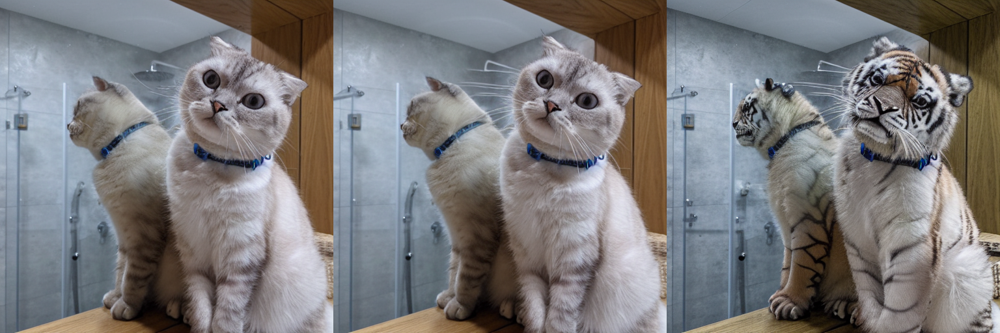

In [38]:
prompt_edit = "a tiger sitting next to a mirror"
base_img, edit_img = null_text_inversion.prompt2prompt(prompt, prompt_edit,
                                                            cross_att_replace_scale = [0.0, 0.8],
                                                            self_att_replace_scale = [0.0, 0.6], 
                                                            uncond_embedding_list=uncond_embedding_list,
                                                            init_latent=latent_init)
view_images([rec_img, base_img, edit_img])

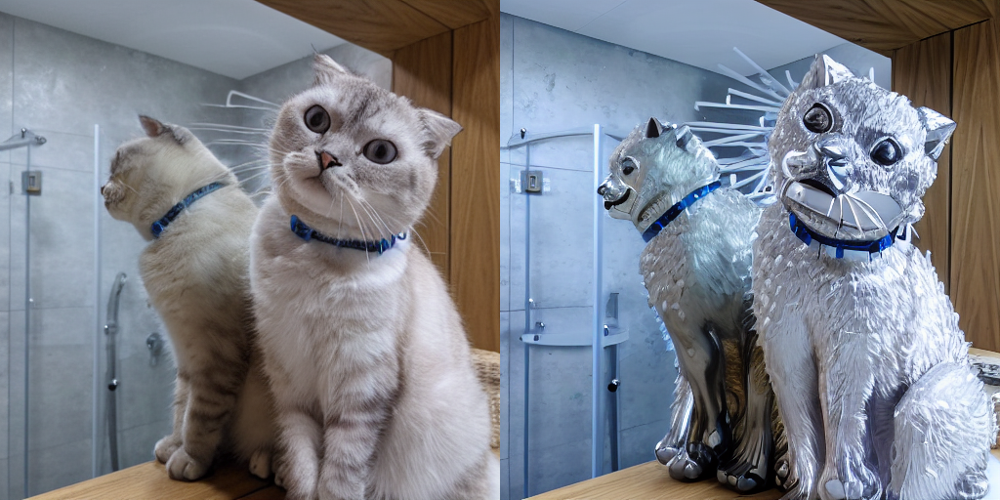

In [40]:
prompt_edit = "a silver cat sculpture sitting next to a mirror"
base_img, edit_img = null_text_inversion.prompt2prompt(prompt, prompt_edit,
                                                            word_weights = [("silver", 2), ("sculpture", 2)],
                                                            cross_att_replace_scale = [0.0, 0.8],
                                                            self_att_replace_scale = [0.0, 0.6], 
                                                            uncond_embedding_list=uncond_embedding_list,
                                                            init_latent=latent_init)
view_images([base_img, edit_img])

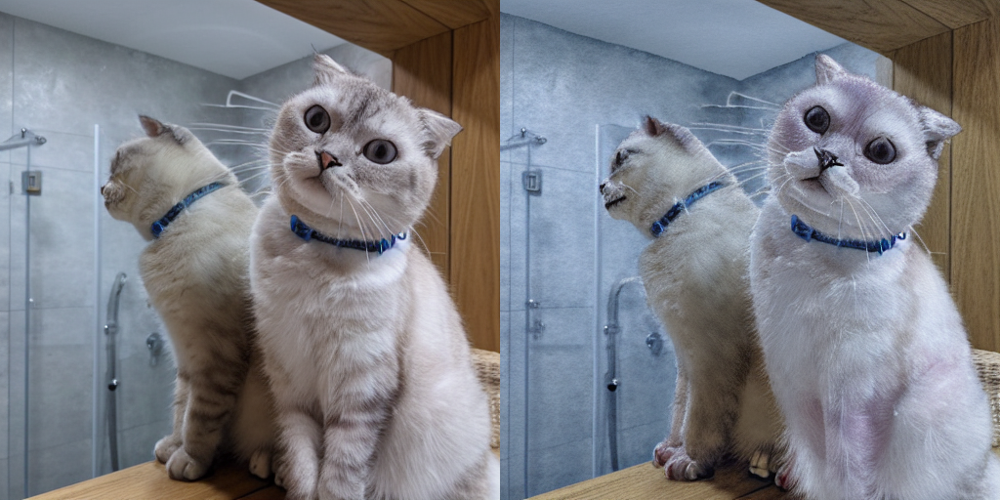

In [43]:
prompt_edit = "watercolor painting of a cat sitting next to a mirror"
base_img, edit_img = null_text_inversion.prompt2prompt(prompt, prompt_edit,
                                                            word_weights = [("watercolor", 5)],
                                                            cross_att_replace_scale = [0.0, 0.8],
                                                            self_att_replace_scale = [0.0, 0.7], 
                                                            uncond_embedding_list=uncond_embedding_list,
                                                            init_latent=latent_init)
view_images([base_img, edit_img])

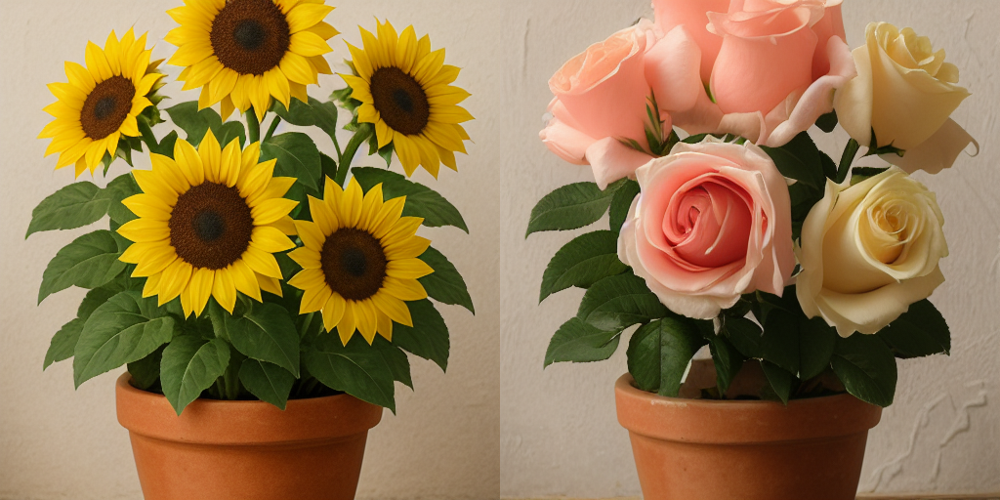

In [ ]:
prompt = "A pot of bright sunflowers"
prompt_edit = "A pot of bright roses"
image = load_512("../ref.png")
rec_img, latent_init, uncond_embedding_list = null_text_inversion.invert(image, prompt)
base_img, edit_img = null_text_inversion.prompt2prompt(prompt, prompt_edit,
                                                            cross_att_replace_scale = [0.0, 0.8],
                                                            self_att_replace_scale = [0.0, 0.2], 
                                                            uncond_embedding_list=uncond_embedding_list,
                                                            init_latent=latent_init)
view_images([base_img, edit_img])

Raw P2P Editing

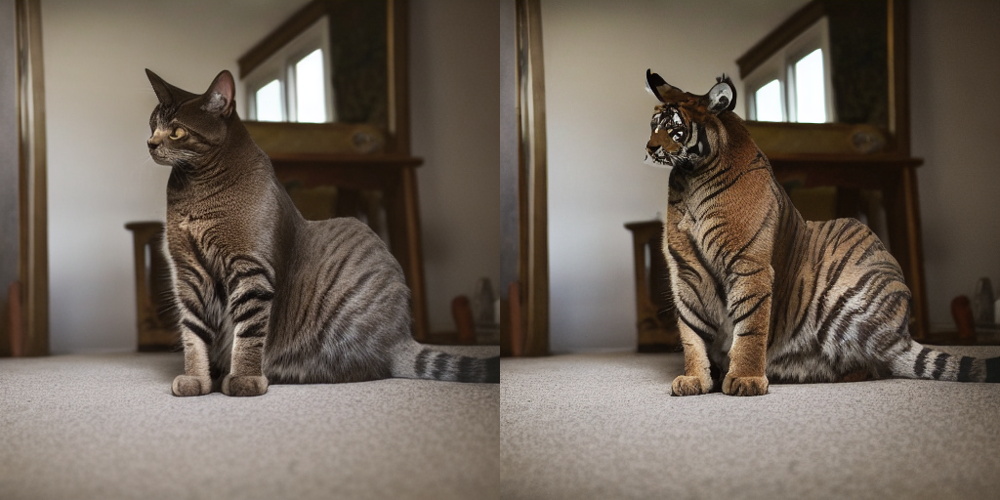

In [ ]:
prompts = ["a cat sitting next to a mirror",
           "a tiger sitting next to a mirror"
        ]
base_img, edit_img = null_text_inversion.prompt2prompt(prompts[0], prompts[1],
                                                             cross_att_replace_scale = [0.0, 0.6],
                                                             self_att_replace_scale = [0.0, 0.8],
                                                             is_scale=True)

view_images([base_img, edit_img])

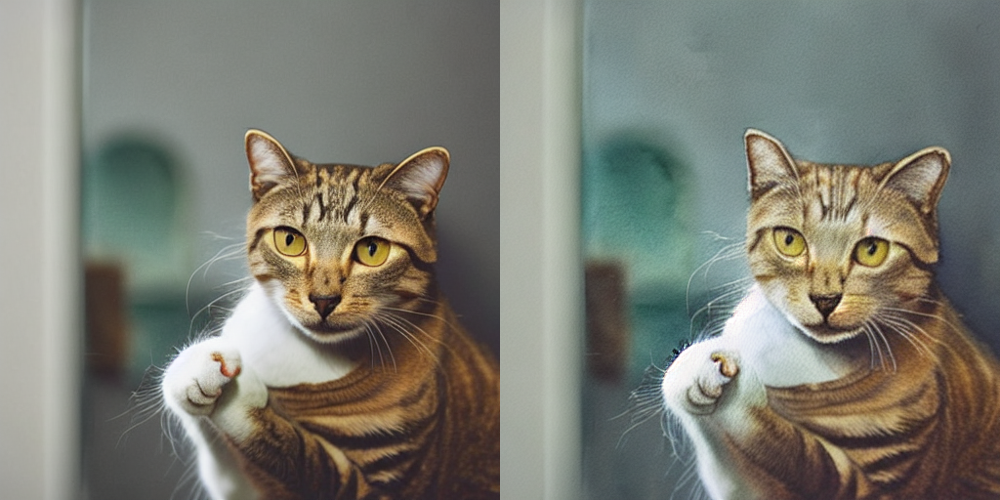

In [60]:
prompts = ["a cat sitting next to a mirror",
           "watercolor painting of a cat sitting next to a mirror"
        ]
base_img, edit_img = null_text_inversion.prompt2prompt(prompts[0], prompts[1],
                                                             word_weights = [("watercolor", 5)], # Amplify the word "watercolor" by 5 times
                                                             cross_att_replace_scale = [0.0, 0.6],
                                                             self_att_replace_scale = [0.0, 0.8],
                                                             is_scale=True)

view_images([base_img, edit_img])

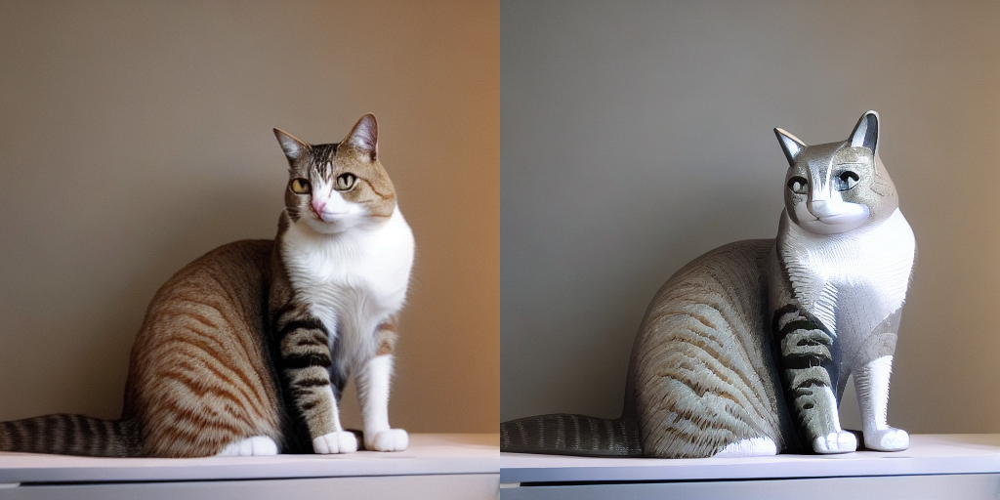

In [61]:
prompts = ["a cat sitting next to a mirror",
           "a silver cat sculpture sitting next to a mirror"
        ]
base_img, edit_img = null_text_inversion.prompt2prompt(prompts[0], prompts[1],
                                                        word_weights = [("silver", 2), ("sculpture", 2)],
                                                        cross_att_replace_scale = [0.0, 0.6],
                                                        self_att_replace_scale = [0.0, 0.8],
                                                        is_scale=True)
view_images([base_img, edit_img])

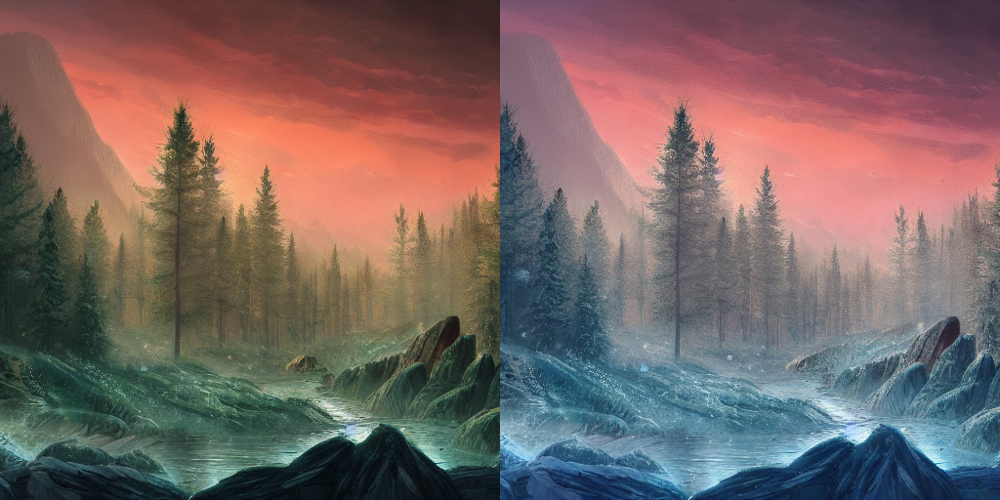

In [62]:
prompts = ["A fantasy landscape with a pine forest, trending on artstation", 
           "A winter fantasy landscape with a pine forest, trending on artstation"
        ]
base_img, edit_img = null_text_inversion.prompt2prompt(prompts[0], prompts[1],
                                                        cross_att_replace_scale = [0.0, 0.6],
                                                        self_att_replace_scale = [0.0, 0.8],
                                                        is_scale=True)
view_images([base_img, edit_img])

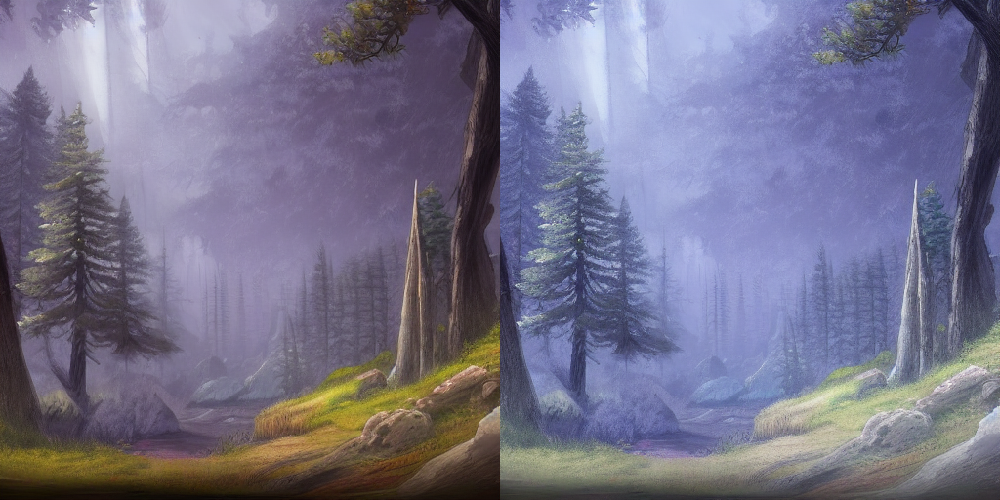

In [64]:
prompts = ["A fantasy landscape with a pine forest, trending on artstation", 
           "A winter fantasy landscape with a pine forest, trending on artstation"
        ]
base_img, edit_img = null_text_inversion.prompt2prompt(prompts[0], prompts[1],
                                                        word_weights = [("winter", -4)], # Decrease the word "winter" by 4 times
                                                        cross_att_replace_scale = [0.0, 0.6],
                                                        self_att_replace_scale = [0.0, 0.8],
                                                        is_scale=True)
view_images([base_img, edit_img])

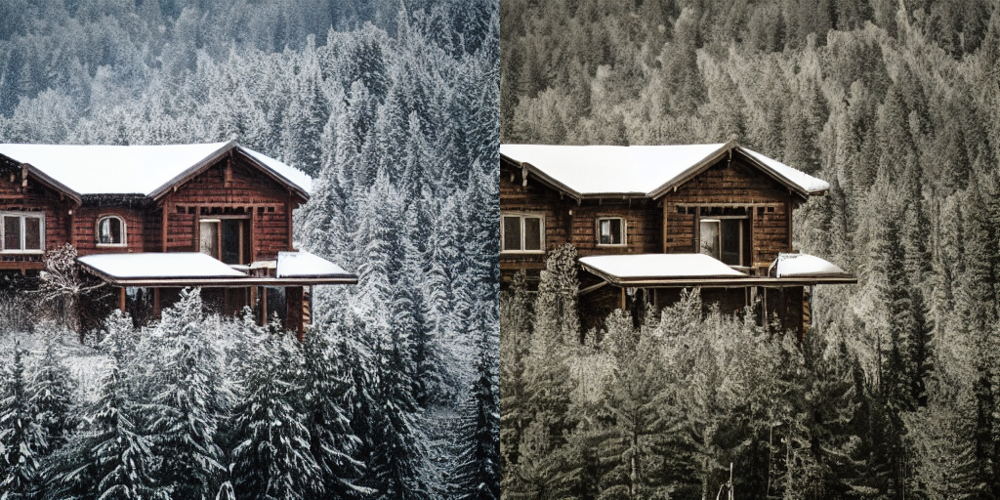

In [67]:
prompts = [
    "A photo of a house on a snowy mountain", 
    "A photo of a house on a snowy mountain"
]
base_img, edit_img = null_text_inversion.prompt2prompt(prompts[0], prompts[1],
                                                        word_weights = [("snowy", -2)], 
                                                        cross_att_replace_scale = [0.0, 0.8],
                                                        self_att_replace_scale = [0.0, 0.5],
                                                        is_scale=True)
view_images([base_img, edit_img])